In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns


In [4]:
ds=pd.read_csv('US_Accidents_Dec21_updated.csv')
ds.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


## info abt data

In [5]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

## statical data

In [6]:
ds.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,1.101431e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.295884e+06
mean,2.137572e+00,3.624520e+01,-9.711463e+01,3.624532e+01,-9.711439e+01,7.026779e-01,8.089408e+03,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.016940e-03
std,4.787216e-01,5.363797e+00,1.831782e+01,5.363873e+00,1.831763e+01,1.560361e+00,1.836009e+04,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.348831e-02
min,1.000000e+00,2.456603e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.344517e+01,-1.180331e+02,3.344628e+01,-1.180333e+02,5.200000e-02,1.270000e+03,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00
50%,2.000000e+00,3.609861e+01,-9.241808e+01,3.609799e+01,-9.241772e+01,2.440000e-01,4.007000e+03,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.016024e+01,-8.037243e+01,4.016105e+01,-8.037338e+01,7.640000e-01,9.567000e+03,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01


# numeric data 

In [7]:
numeric_ds = ds.select_dtypes(include=['int64', 'float64'])
numeric_ds

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
0,3,40.108910,-83.092860,40.112060,-83.031870,3.230,NaN,42.1,36.1,58.0,29.76,10.0,10.4,0.00
1,2,39.865420,-84.062800,39.865010,-84.048730,0.747,NaN,36.9,NaN,91.0,29.68,10.0,NaN,0.02
2,2,39.102660,-84.524680,39.102090,-84.523960,0.055,NaN,36.0,NaN,97.0,29.70,10.0,NaN,0.02
3,2,41.062130,-81.537840,41.062170,-81.535470,0.123,NaN,39.0,NaN,55.0,29.65,10.0,NaN,NaN
4,3,39.172393,-84.492792,39.170476,-84.501798,0.500,NaN,37.0,29.8,93.0,29.69,10.0,10.4,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845337,2,34.002480,-117.379360,33.998880,-117.370940,0.543,NaN,86.0,86.0,40.0,28.92,10.0,13.0,0.00
2845338,2,32.766960,-117.148060,32.765550,-117.153630,0.338,NaN,70.0,70.0,73.0,29.39,10.0,6.0,0.00
2845339,2,33.775450,-117.847790,33.777400,-117.857270,0.561,NaN,73.0,73.0,64.0,29.74,10.0,10.0,0.00
2845340,2,33.992460,-118.403020,33.983110,-118.395650,0.772,NaN,71.0,71.0,81.0,29.62,10.0,8.0,0.00


In [8]:
len(numeric_ds.columns)

14

In [9]:
categorical_ds = ds.select_dtypes(include=['object'])
categorical_ds

,ID,Start_Time,End_Time,Description,Street,Side,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Wind_Direction,Weather_Condition,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,2016-02-08 00:37:08,2016-02-08 06:37:08,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,Outerbelt E,R,Dublin,Franklin,OH,43017,US,US/Eastern,KOSU,2016-02-08 00:53:00,SW,Light Rain,Night,Night,Night,Night
1,A-2,2016-02-08 05:56:20,2016-02-08 11:56:20,At OH-4/OH-235/Exit 41 - Accident.,I-70 E,R,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,Calm,Light Rain,Night,Night,Night,Night
2,A-3,2016-02-08 06:15:39,2016-02-08 12:15:39,At I-71/US-50/Exit 1 - Accident.,I-75 S,R,Cincinnati,Hamilton,OH,45203,US,US/Eastern,KLUK,2016-02-08 05:53:00,Calm,Overcast,Night,Night,Night,Day
3,A-4,2016-02-08 06:51:45,2016-02-08 12:51:45,At Dart Ave/Exit 21 - Accident.,I-77 N,R,Akron,Summit,OH,44311,US,US/Eastern,KAKR,2016-02-08 06:54:00,Calm,Overcast,Night,Night,Day,Day
4,A-5,2016-02-08 07:53:43,2016-02-08 13:53:43,At Mitchell Ave/Exit 6 - Accident.,I-75 S,R,Cincinnati,Hamilton,OH,45217,US,US/Eastern,KLUK,2016-02-08 07:53:00,WSW,Light Rain,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845337,A-2845338,2019-08-23 18:03:25,2019-08-23 18:32:01,At Market St - Accident.,Pomona Fwy E,R,Riverside,Riverside,CA,92501,US,US/Pacific,KRAL,2019-08-23 17:53:00,W,Fair,Day,Day,Day,Day
2845338,A-2845339,2019-08-23 19:11:30,2019-08-23 19:38:23,At Camino Del Rio/Mission Center Rd - Accident.,I-8 W,R,San Diego,San Diego,CA,92108,US,US/Pacific,KMYF,2019-08-23 18:53:00,SW,Fair,Day,Day,Day,Day
2845339,A-2845340,2019-08-23 19:00:21,2019-08-23 19:28:49,At Glassell St/Grand Ave - Accident. in the ri...,Garden Grove Fwy,R,Orange,Orange,CA,92866,US,US/Pacific,KSNA,2019-08-23 18:53:00,SSW,Partly Cloudy,Day,Day,Day,Day
2845340,A-2845341,2019-08-23 19:00:21,2019-08-23 19:29:42,At CA-90/Marina Fwy/Jefferson Blvd - Accident.,San Diego Fwy S,R,Culver City,Los Angeles,CA,90230,US,US/Pacific,KSMO,2019-08-23 18:51:00,SW,Fair,Day,Day,Day,Day


In [10]:
len(categorical_ds.columns)

20

## NaN

In [11]:
ds.isna()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845337,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2845338,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2845339,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2845340,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [12]:
ds.isnull().sum()

ID                             0
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                        0
End_Lng                        0
Distance(mi)                   0
Description                    0
Number                   1743911
Street                         2
Side                           0
City                         137
County                         0
State                          0
Zipcode                     1319
Country                        0
Timezone                    3659
Airport_Code                9549
Weather_Timestamp          50736
Temperature(F)             69274
Wind_Chill(F)             469643
Humidity(%)                73092
Pressure(in)               59200
Visibility(mi)             70546
Wind_Direction             73775
Wind_Speed(mph)           157944
Precipitation(in)         549458
Weather_Condition          70636
Amenity   

# missing value percent on each column

In [13]:
missing_vl_per=ds.isna().sum().sort_values(ascending=[False])/len(ds)*100
missing_vl_per

Number                   61.290031
Precipitation(in)        19.310789
Wind_Chill(F)            16.505678
Wind_Speed(mph)           5.550967
Wind_Direction            2.592834
Humidity(%)               2.568830
Weather_Condition         2.482514
Visibility(mi)            2.479350
Temperature(F)            2.434646
Pressure(in)              2.080593
Weather_Timestamp         1.783125
Airport_Code              0.335601
Timezone                  0.128596
Nautical_Twilight         0.100761
Civil_Twilight            0.100761
Sunrise_Sunset            0.100761
Astronomical_Twilight     0.100761
Zipcode                   0.046356
City                      0.004815
Street                    0.000070
Country                   0.000000
Junction                  0.000000
Start_Time                0.000000
End_Time                  0.000000
Start_Lat                 0.000000
Turning_Loop              0.000000
Traffic_Signal            0.000000
Traffic_Calming           0.000000
Stop                

In [14]:
missing_vl_per!=0

Number                    True
Precipitation(in)         True
Wind_Chill(F)             True
Wind_Speed(mph)           True
Wind_Direction            True
Humidity(%)               True
Weather_Condition         True
Visibility(mi)            True
Temperature(F)            True
Pressure(in)              True
Weather_Timestamp         True
Airport_Code              True
Timezone                  True
Nautical_Twilight         True
Civil_Twilight            True
Sunrise_Sunset            True
Astronomical_Twilight     True
Zipcode                   True
City                      True
Street                    True
Country                  False
Junction                 False
Start_Time               False
End_Time                 False
Start_Lat                False
Turning_Loop             False
Traffic_Signal           False
Traffic_Calming          False
Stop                     False
Station                  False
Roundabout               False
Railway                  False
No_Exit 

In [15]:
missing_vl_per[missing_vl_per!=0]

Number                   61.290031
Precipitation(in)        19.310789
Wind_Chill(F)            16.505678
Wind_Speed(mph)           5.550967
Wind_Direction            2.592834
Humidity(%)               2.568830
Weather_Condition         2.482514
Visibility(mi)            2.479350
Temperature(F)            2.434646
Pressure(in)              2.080593
Weather_Timestamp         1.783125
Airport_Code              0.335601
Timezone                  0.128596
Nautical_Twilight         0.100761
Civil_Twilight            0.100761
Sunrise_Sunset            0.100761
Astronomical_Twilight     0.100761
Zipcode                   0.046356
City                      0.004815
Street                    0.000070
dtype: float64

# missing data plot

<AxesSubplot: >

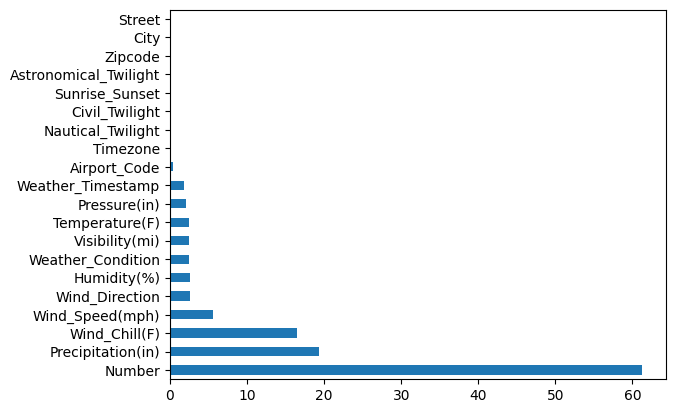

In [16]:
missing_vl_per[missing_vl_per!=0].plot(kind="barh")

In [17]:
len(ds.City.unique())

11682

In [18]:
ds.State

0          OH
1          OH
2          OH
3          OH
4          OH
           ..
2845337    CA
2845338    CA
2845339    CA
2845340    CA
2845341    CA
Name: State, Length: 2845342, dtype: object

In [19]:
ds.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

# unique states

In [20]:
ds.State.unique()

array(['OH', 'IN', 'KY', 'WV', 'MI', 'PA', 'CA', 'NV', 'MN', 'TX', 'MO',
       'CO', 'OK', 'LA', 'KS', 'WI', 'IA', 'MS', 'NE', 'ND', 'WY', 'SD',
       'MT', 'NM', 'AR', 'IL', 'NJ', 'GA', 'FL', 'NY', 'CT', 'RI', 'SC',
       'NC', 'MD', 'MA', 'TN', 'VA', 'DE', 'DC', 'ME', 'AL', 'NH', 'VT',
       'AZ', 'UT', 'ID', 'OR', 'WA'], dtype=object)

# Grouping data by city and state

In [21]:
city_with_state=ds.groupby(['State','City']).size()
city_with_state

State  City       
AL     Abbeville        6
       Adamsville       6
       Addison          2
       Alabaster      188
       Albertville     10
                     ... 
WY     Torrington       2
       Wamsutter       69
       Wheatland       26
       Wilson           4
       Worland          1
Length: 16930, dtype: int64

In [22]:
city_with_state_occ=ds.groupby(['State','City']).size().reset_index(name='count')
city_with_state_occ

,State,City,count
0,AL,Abbeville,6
1,AL,Adamsville,6
2,AL,Addison,2
3,AL,Alabaster,188
4,AL,Albertville,10
...,...,...,...
16925,WY,Torrington,2
16926,WY,Wamsutter,69
16927,WY,Wheatland,26
16928,WY,Wilson,4


# Grouping data by city

In [23]:
city_occ=ds.groupby(['City']).size().reset_index(name='count')
city_occ

,City,count
0,Aaronsburg,9
1,Abbeville,139
2,Abbotsford,9
3,Abbottstown,25
4,Aberdeen,574
...,...,...
11676,Zortman,13
11677,Zumbro Falls,40
11678,Zumbrota,282
11679,Zuni,18


# Grouping data state

In [24]:
state_occ=ds.groupby(['State']).size().reset_index(name='count')
state_occ

,State,count
0,AL,19322
1,AR,10935
2,AZ,56504
3,CA,795868
4,CO,25340
5,CT,29762
6,DC,9133
7,DE,4842
8,FL,401388
9,GA,40086


# Which states have Highest number of accidents?

In [25]:
state_occ_ass=state_occ.sort_values(by=['count'],
    axis=0,
    ascending=False)
state_occ_ass

,State,count
3,CA,795868
8,FL,401388
41,TX,149037
35,OR,126341
43,VA,113535
32,NY,108049
36,PA,99975
21,MN,97185
25,NC,91362
38,SC,89216


# Which Cities have Highest number of accidents?

In [26]:
city_occ_ass=city_occ.sort_values(by=['count'],
    axis=0,
    ascending=False)
city_occ_ass

,City,count
6612,Miami,106966
5981,Los Angeles,68956
7773,Orlando,54691
2470,Dallas,41979
4836,Houston,39448
...,...,...
8517,Prospect Hill,1
1224,Brooklyn Heights,1
8519,Prosper,1
8524,Proviso,1


# Which Cities have Highest number of accidents? #2

In [27]:
cities_by_accidents = ds.City.value_counts()
cities_by_accidents

Miami                           106966
Los Angeles                      68956
Orlando                          54691
Dallas                           41979
Houston                          39448
                                 ...  
Ridgedale                            1
Sekiu                                1
Wooldridge                           1
Bullock                              1
American Fork-Pleasant Grove         1
Name: City, Length: 11681, dtype: int64

# Which States have Highest number of accidents? #2

In [28]:
state_by_accidents = ds.State.value_counts()
state_by_accidents

CA    795868
FL    401388
TX    149037
OR    126341
VA    113535
NY    108049
PA     99975
MN     97185
NC     91362
SC     89216
MD     65085
AZ     56504
NJ     52902
TN     52613
UT     49193
LA     47232
IL     47105
MI     43843
GA     40086
WA     32554
CT     29762
MO     29633
CO     25340
OH     24409
IN     20850
AL     19322
MT     15964
AR     10935
IA      9607
DC      9133
KS      9033
OK      8806
ID      8544
WI      7896
WV      7632
KY      6638
MA      6392
NV      6197
MS      5320
DE      4842
RI      4451
NH      3866
NE      3320
NM      2370
ND      2258
ME      2193
WY       990
VT       365
SD       201
Name: State, dtype: int64

In [29]:
state_by_accidents[:5]

CA    795868
FL    401388
TX    149037
OR    126341
VA    113535
Name: State, dtype: int64

# Top 5 States that have lowest number of accidents

In [30]:
state_by_accidents[::-1][:5]

SD     201
VT     365
WY     990
ME    2193
ND    2258
Name: State, dtype: int64

In [31]:
cities_by_accidents[:5]

Miami          106966
Los Angeles     68956
Orlando         54691
Dallas          41979
Houston         39448
Name: City, dtype: int64

# Top 5 cities that have lowest number of accidents

In [32]:
cities_by_accidents[::-1][:5]

American Fork-Pleasant Grove    1
Bullock                         1
Wooldridge                      1
Sekiu                           1
Ridgedale                       1
Name: City, dtype: int64

# Plotting Which Cities have Highest number of accidents

<AxesSubplot: >

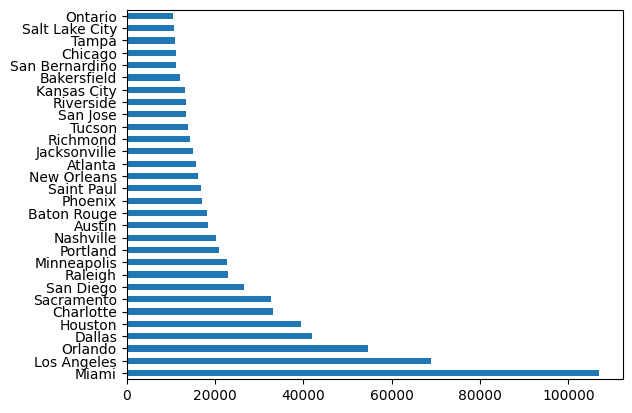

In [33]:
cities_by_accidents[:30].plot(kind='barh')

# Plotting Which States have Highest number of accidents

<AxesSubplot: >

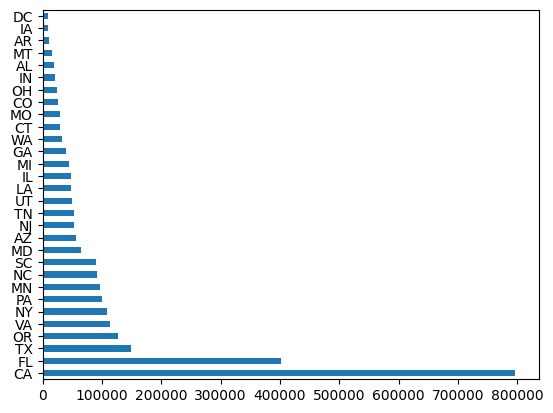

In [34]:
state_by_accidents[:30].plot(kind='barh')

<AxesSubplot: >

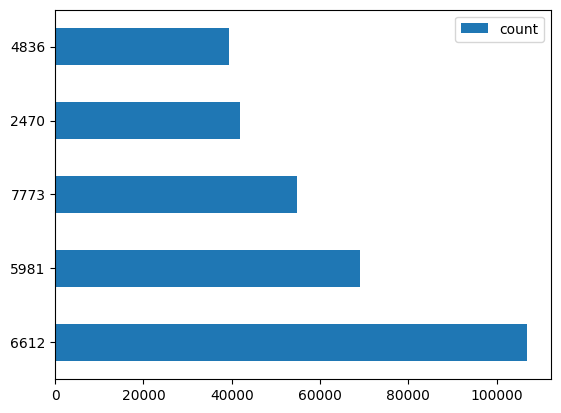

In [35]:
city_occ_ass[:5].plot(kind='barh')

In [36]:
import seaborn as sns

In [37]:
sns.set_style('whitegrid')

# Plotting the trend of number of accident ( exponenetial increase or decrease)

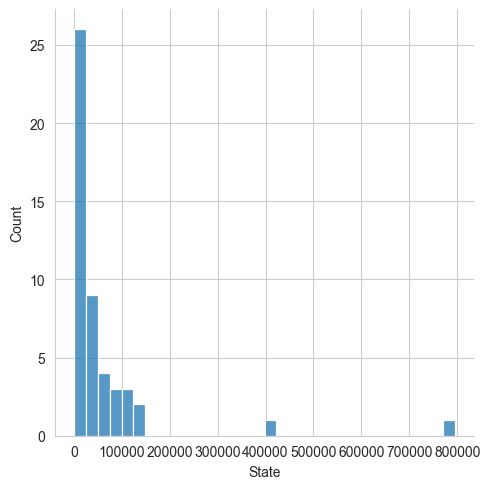

In [38]:
sns.displot(state_by_accidents)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_8928\2948952718.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(state_by_accidents)


<AxesSubplot: xlabel='State', ylabel='Density'>

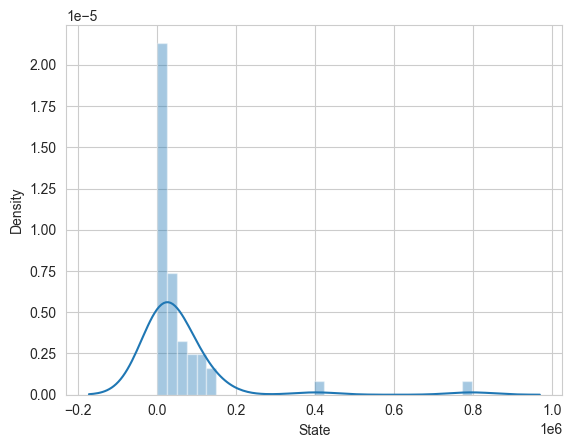

In [39]:
sns.distplot(state_by_accidents)

# Threshold for High and low number of accidents

In [40]:
high_acc_cities=cities_by_accidents[cities_by_accidents>=1000]
low_acc_cities=cities_by_accidents[cities_by_accidents<1000]

<AxesSubplot: ylabel='City'>

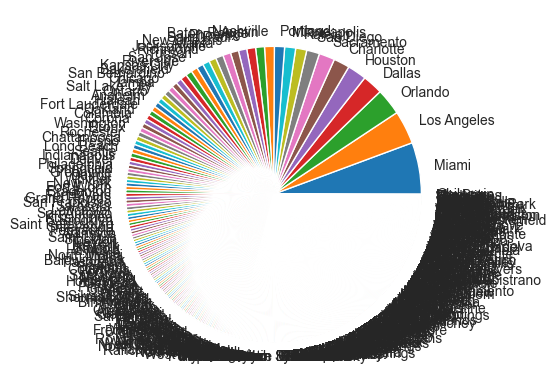

In [41]:
high_acc_cities.plot(kind='pie')

# Plotting those Cities which have Highest number of accidents?

In [42]:
high_acc_cities

Miami          106966
Los Angeles     68956
Orlando         54691
Dallas          41979
Houston         39448
                ...  
Tualatin         1001
Utica            1001
Los Banos        1001
Mankato          1000
Chiloquin        1000
Name: City, Length: 496, dtype: int64

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_8928\897794027.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(high_acc_cities)


<AxesSubplot: xlabel='City', ylabel='Density'>

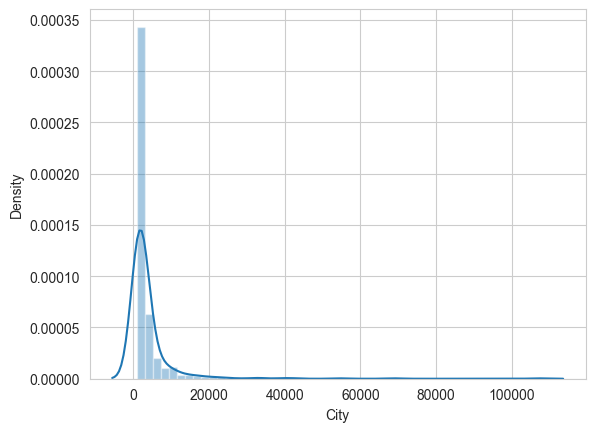

In [43]:
sns.distplot(high_acc_cities)

# Plotting those Cities which have lowest number of accidents?

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_8928\859734423.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(low_acc_cities)


<AxesSubplot: xlabel='City', ylabel='Density'>

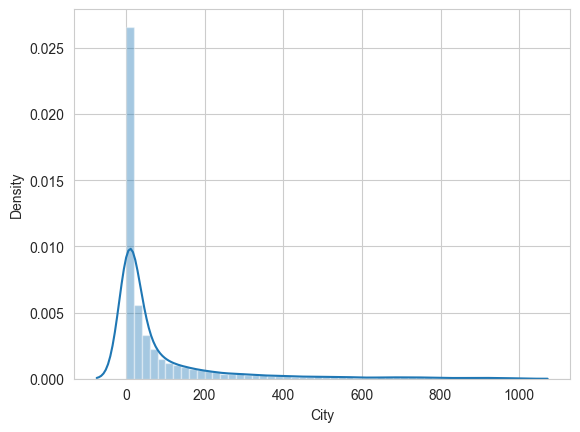

In [44]:
sns.distplot(low_acc_cities)

# Plotting the overall ratio of accidents?

<AxesSubplot: xlabel='City', ylabel='Count'>

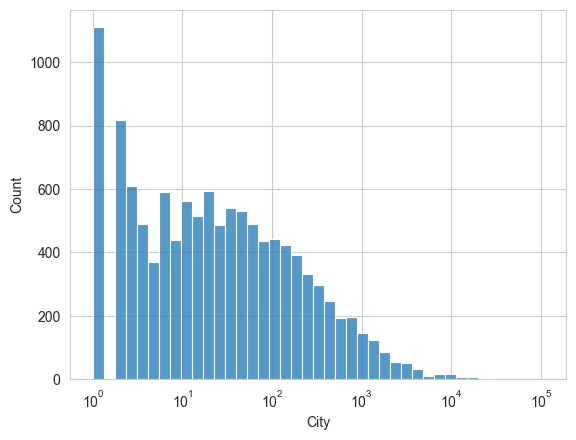

In [46]:
sns.histplot(cities_by_accidents,log_scale=True)

In [47]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

In [48]:
ds["Start_Time"]

0          2016-02-08 00:37:08
1          2016-02-08 05:56:20
2          2016-02-08 06:15:39
3          2016-02-08 06:51:45
4          2016-02-08 07:53:43
                  ...         
2845337    2019-08-23 18:03:25
2845338    2019-08-23 19:11:30
2845339    2019-08-23 19:00:21
2845340    2019-08-23 19:00:21
2845341    2019-08-23 18:52:06
Name: Start_Time, Length: 2845342, dtype: object

In [49]:
ds.Start_Time

0          2016-02-08 00:37:08
1          2016-02-08 05:56:20
2          2016-02-08 06:15:39
3          2016-02-08 06:51:45
4          2016-02-08 07:53:43
                  ...         
2845337    2019-08-23 18:03:25
2845338    2019-08-23 19:11:30
2845339    2019-08-23 19:00:21
2845340    2019-08-23 19:00:21
2845341    2019-08-23 18:52:06
Name: Start_Time, Length: 2845342, dtype: object

In [50]:
ds.Start_Time = pd.to_datetime(ds.Start_Time)

In [51]:
ds.Start_Time

0         2016-02-08 00:37:08
1         2016-02-08 05:56:20
2         2016-02-08 06:15:39
3         2016-02-08 06:51:45
4         2016-02-08 07:53:43
                  ...        
2845337   2019-08-23 18:03:25
2845338   2019-08-23 19:11:30
2845339   2019-08-23 19:00:21
2845340   2019-08-23 19:00:21
2845341   2019-08-23 18:52:06
Name: Start_Time, Length: 2845342, dtype: datetime64[ns]

# The Hours during which have Highest number of accidents in a day?

<AxesSubplot: xlabel='Start_Time', ylabel='Count'>

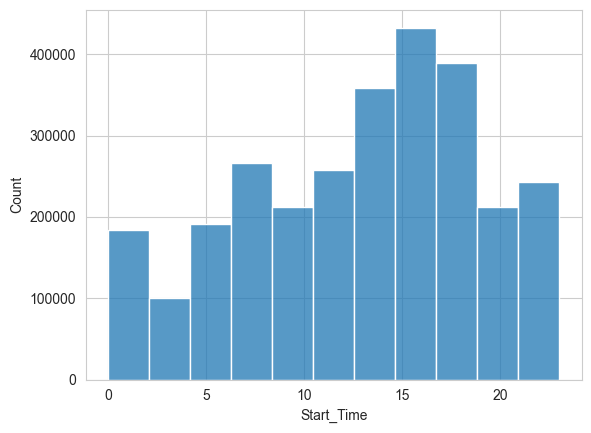

In [52]:
sns.histplot(ds.Start_Time.dt.hour,bins=11)

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_8928\783296385.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ds.Start_Time.dt.hour)


<AxesSubplot: xlabel='Start_Time', ylabel='Density'>

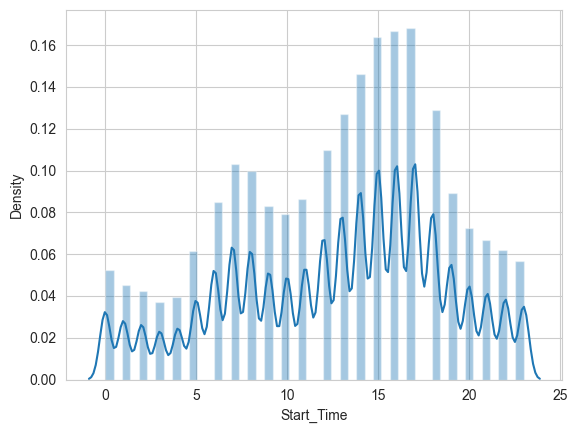

In [53]:
sns.distplot(ds.Start_Time.dt.hour)

# The days during which have Highest number of accidents in a week?

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_8928\3023826749.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ds.Start_Time.dt.dayofweek)


<AxesSubplot: xlabel='Start_Time', ylabel='Density'>

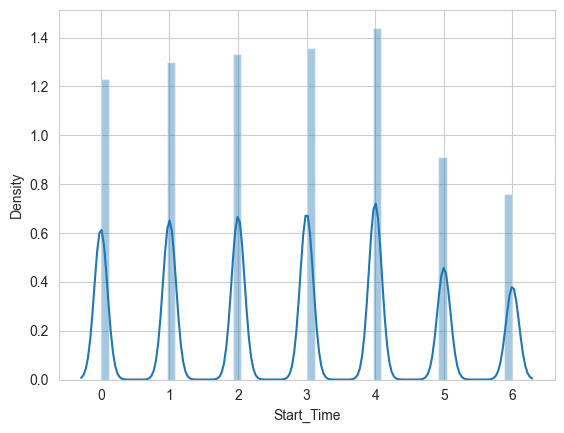

In [54]:
sns.distplot(ds.Start_Time.dt.dayofweek)

# How many Accidents occured on Sunday

In [55]:
sunday_start_time=ds.Start_Time[ds.Start_Time.dt.dayofweek==6]

<AxesSubplot: xlabel='Start_Time', ylabel='Count'>

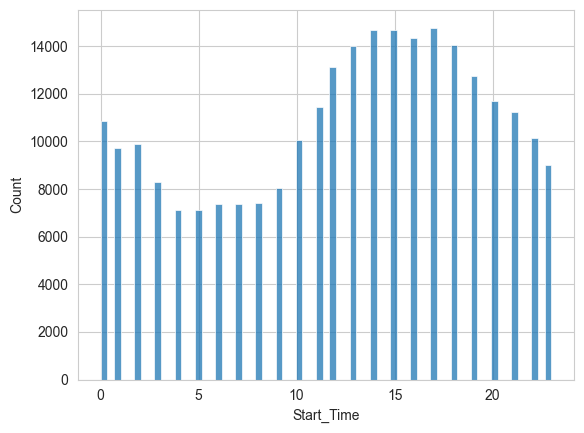

In [56]:
sns.histplot(sunday_start_time.dt.hour)

# for understanding

In [57]:
sunday_start_time=ds[ds.Start_Time.dt.dayofweek==6]

In [59]:
sns.histplot(sunday_start_time.dt.hour)

AttributeError: 'DataFrame' object has no attribute 'dt'

# Trend of accident in 2021

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
224945,A-224946,2,2021-03-10 19:57:00,2021-03-11 05:28:02,42.382359,-71.022318,42.383346,-71.021204,0.089,RT-1A Both Directions 0.20 mi. before Curtis St,...,False,False,False,False,False,False,Night,Night,Night,Night
224946,A-224947,2,2021-07-30 23:37:00,2021-07-31 03:22:58,40.908676,-123.707116,40.904856,-123.740056,1.740,Accident on CA-96 (CA-299) from CR-7K100/Titlo...,...,False,False,False,False,False,False,Night,Night,Night,Night
224947,A-224948,2,2021-10-15 16:42:36,2021-10-15 17:02:36,38.970628,-77.116333,38.973149,-77.121876,0.345,Stationary traffic on MD-190 from Dorset Ave (...,...,False,True,False,False,False,False,Day,Day,Day,Day
224948,A-224949,2,2021-12-21 11:42:00,2021-12-21 12:21:00,47.642651,-122.318590,47.643411,-122.308460,0.474,Slow traffic on WA-520 E from I-5/Roanoke St/H...,...,False,False,False,False,False,False,Day,Day,Day,Day
224949,A-224950,2,2021-12-09 08:51:00,2021-12-09 11:01:22,37.419536,-122.090640,37.410966,-122.076087,0.994,Accident on Amphitheatre Pkwy (US-101) from Sh...,...,False,False,False,False,False,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2068385,A-2068386,2,2021-01-01 00:04:00,2021-01-01 01:20:44,33.932945,-118.280711,33.929954,-118.281052,0.208,Incident on I-110 SB near IMPERIAL HWY Drive w...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068522,A-2068523,2,2021-01-01 01:42:00,2021-01-01 03:51:09,34.172340,-118.532685,34.173440,-118.539715,0.409,AT. UNK MAKE OR COLOR OF VICT VEH THE SV HIT A...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068635,A-2068636,2,2021-01-01 03:00:33,2021-01-01 05:00:33,44.069885,-121.306432,44.067645,-121.307392,0.162,An unconfirmed report of hazardous debris has ...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068931,A-2068932,2,2021-01-01 02:26:00,2021-01-01 06:15:49,37.998126,-121.811133,37.997990,-121.810109,0.057,EB 4 ON A ST OFR. [Notification] [CHP]-Problem...,...,False,False,False,False,False,False,Night,Night,Night,Night


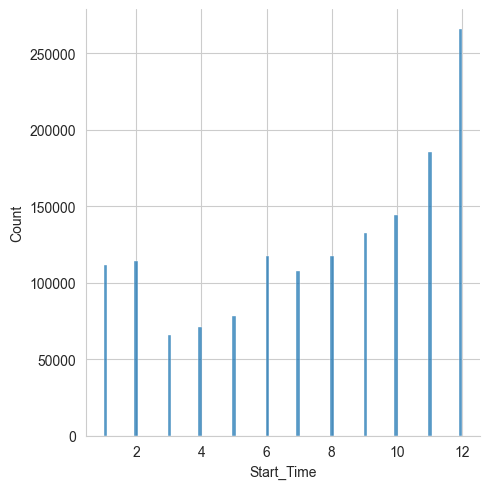

In [68]:
ds_2021 = ds[ds.Start_Time.dt.year == 2021]
sns.displot(ds_2021.Start_Time.dt.month)
ds_2021

# for understanding

In [69]:
df_2021 = ds.Start_Time[ds.Start_Time.dt.year == 2021]

ds_2021

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
224945,A-224946,2,2021-03-10 19:57:00,2021-03-11 05:28:02,42.382359,-71.022318,42.383346,-71.021204,0.089,RT-1A Both Directions 0.20 mi. before Curtis St,...,False,False,False,False,False,False,Night,Night,Night,Night
224946,A-224947,2,2021-07-30 23:37:00,2021-07-31 03:22:58,40.908676,-123.707116,40.904856,-123.740056,1.740,Accident on CA-96 (CA-299) from CR-7K100/Titlo...,...,False,False,False,False,False,False,Night,Night,Night,Night
224947,A-224948,2,2021-10-15 16:42:36,2021-10-15 17:02:36,38.970628,-77.116333,38.973149,-77.121876,0.345,Stationary traffic on MD-190 from Dorset Ave (...,...,False,True,False,False,False,False,Day,Day,Day,Day
224948,A-224949,2,2021-12-21 11:42:00,2021-12-21 12:21:00,47.642651,-122.318590,47.643411,-122.308460,0.474,Slow traffic on WA-520 E from I-5/Roanoke St/H...,...,False,False,False,False,False,False,Day,Day,Day,Day
224949,A-224950,2,2021-12-09 08:51:00,2021-12-09 11:01:22,37.419536,-122.090640,37.410966,-122.076087,0.994,Accident on Amphitheatre Pkwy (US-101) from Sh...,...,False,False,False,False,False,False,Day,Day,Day,Day
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2068385,A-2068386,2,2021-01-01 00:04:00,2021-01-01 01:20:44,33.932945,-118.280711,33.929954,-118.281052,0.208,Incident on I-110 SB near IMPERIAL HWY Drive w...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068522,A-2068523,2,2021-01-01 01:42:00,2021-01-01 03:51:09,34.172340,-118.532685,34.173440,-118.539715,0.409,AT. UNK MAKE OR COLOR OF VICT VEH THE SV HIT A...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068635,A-2068636,2,2021-01-01 03:00:33,2021-01-01 05:00:33,44.069885,-121.306432,44.067645,-121.307392,0.162,An unconfirmed report of hazardous debris has ...,...,False,False,False,False,False,False,Night,Night,Night,Night
2068931,A-2068932,2,2021-01-01 02:26:00,2021-01-01 06:15:49,37.998126,-121.811133,37.997990,-121.810109,0.057,EB 4 ON A ST OFR. [Notification] [CHP]-Problem...,...,False,False,False,False,False,False,Night,Night,Night,Night


In [70]:
df_20211 = ds[ds.Start_Time.dt.year == 2021]
sns.displot(ds_20211.dt.month)

AttributeError: 'DataFrame' object has no attribute 'dt'

In [71]:
print("Total accidents in 2021",ds_2021.Start_Time.dt.month.value_counts().sum())


Total accidents in 2021 1511745


# Which Type of Severity accident occured most

Text(0, 0.5, 'ylabel')

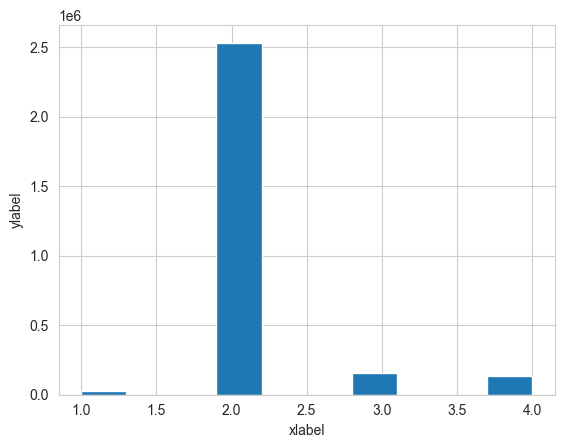

In [72]:
ds.Severity.hist()
plt.xlabel('xlabel')
plt.ylabel('ylabel')

<AxesSubplot: ylabel='Frequency'>

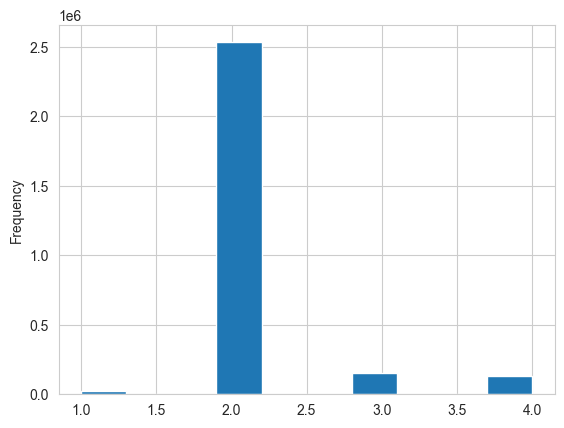

In [73]:
ds.Severity.plot(kind='hist')

In [74]:
ds.Severity

0          3
1          2
2          2
3          2
4          3
          ..
2845337    2
2845338    2
2845339    2
2845340    2
2845341    2
Name: Severity, Length: 2845342, dtype: int64

In [75]:
ds.Severity.value_counts()

2    2532991
3     155105
4     131193
1      26053
Name: Severity, dtype: int64

# checking the number of accident on basis of temparture on 2021

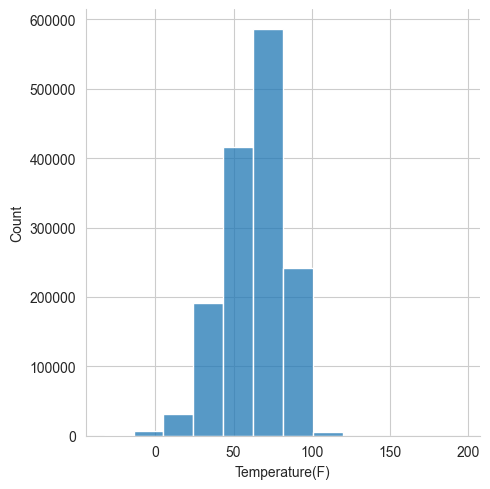

In [76]:
print(sns.displot(ds_2021['Temperature(F)'],bins=12, kde=False))

# Visisbility Impact on Number of Accidents

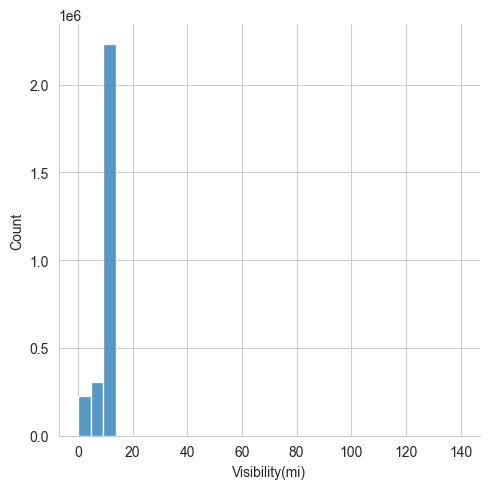

In [77]:
sns.displot(ds['Visibility(mi)'],bins=30)

# Impact of Weather Condition

<AxesSubplot: >

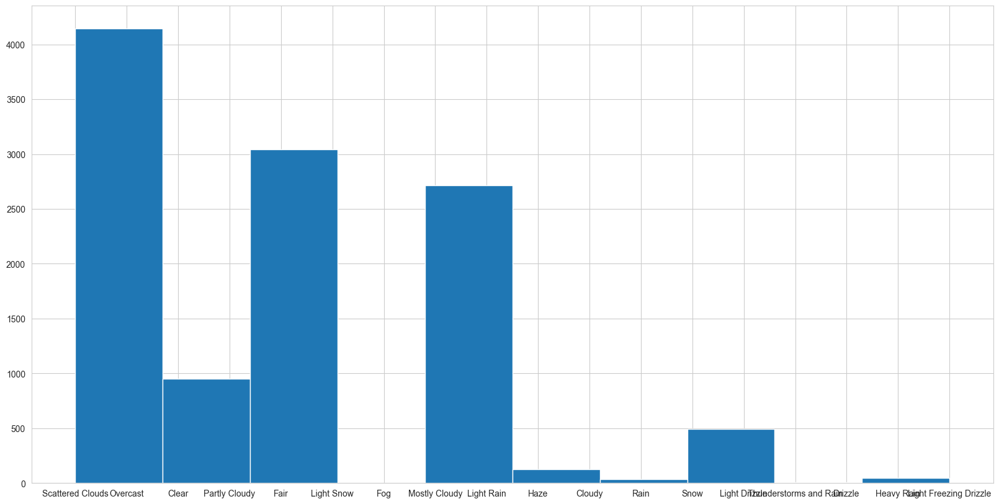

In [78]:
ds.Weather_Condition[cities_by_accidents].hist(figsize=(20,10))

<AxesSubplot: >

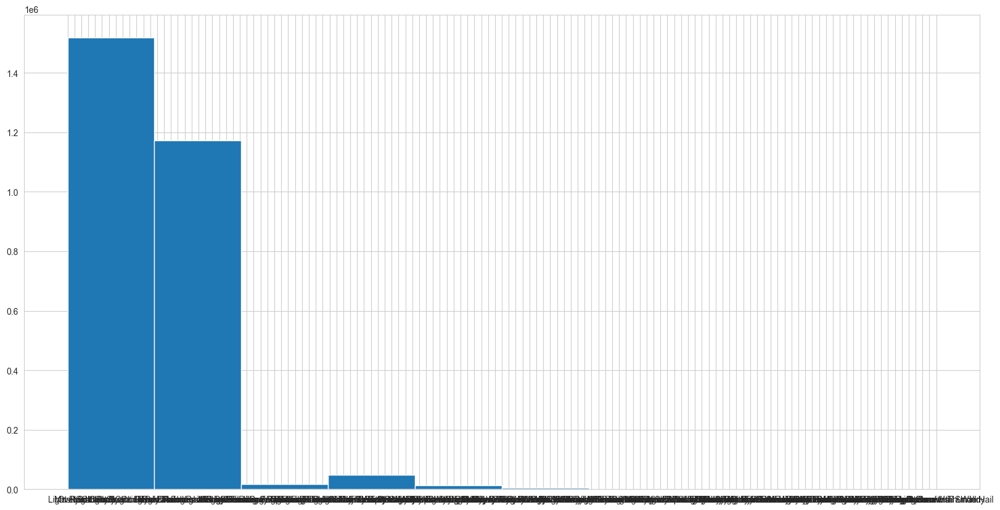

In [79]:
ds.Weather_Condition.hist(figsize=(20,10))

In [80]:
ds.Weather_Condition[cities_by_accidents]

106966    Scattered Clouds
68956     Scattered Clouds
54691             Overcast
41979                Clear
39448                Clear
                ...       
1               Light Rain
1               Light Rain
1               Light Rain
1               Light Rain
1               Light Rain
Name: Weather_Condition, Length: 11681, dtype: object

In [81]:
cities_by_accidents

Miami                           106966
Los Angeles                      68956
Orlando                          54691
Dallas                           41979
Houston                          39448
                                 ...  
Ridgedale                            1
Sekiu                                1
Wooldridge                           1
Bullock                              1
American Fork-Pleasant Grove         1
Name: City, Length: 11681, dtype: int64

In [82]:
ds.Weather_Condition

0             Light Rain
1             Light Rain
2               Overcast
3               Overcast
4             Light Rain
               ...      
2845337             Fair
2845338             Fair
2845339    Partly Cloudy
2845340             Fair
2845341             Fair
Name: Weather_Condition, Length: 2845342, dtype: object

In [83]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   ID                     object        
 1   Severity               int64         
 2   Start_Time             datetime64[ns]
 3   End_Time               object        
 4   Start_Lat              float64       
 5   Start_Lng              float64       
 6   End_Lat                float64       
 7   End_Lng                float64       
 8   Distance(mi)           float64       
 9   Description            object        
 10  Number                 float64       
 11  Street                 object        
 12  Side                   object        
 13  City                   object        
 14  County                 object        
 15  State                  object        
 16  Zipcode                object        
 17  Country                object        
 18  Timezone              

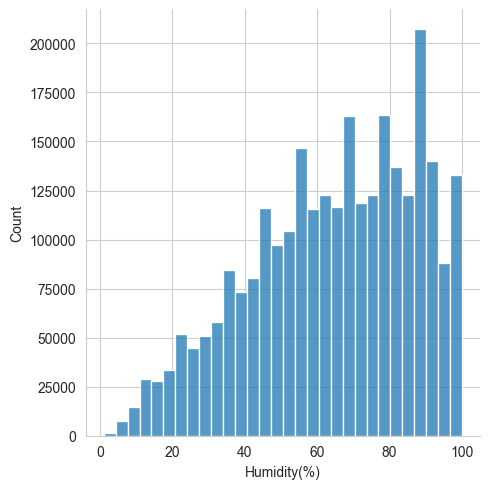

In [84]:
print(sns.displot(ds['Humidity(%)'],bins=30))

# Map of US whhich shows the severity of the accidents.

<AxesSubplot: xlabel='Start_Lng', ylabel='Start_Lat'>

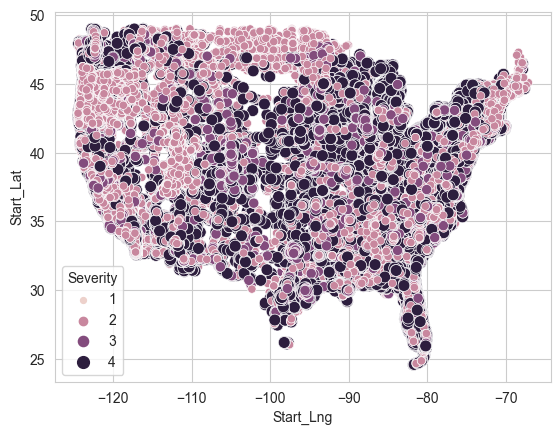

In [85]:
sns.scatterplot(x=ds.Start_Lng,y=ds.Start_Lat,data=ds,size=ds.Severity, hue=ds.Severity)

# map of US which shows the density of the accidents.

<AxesSubplot: xlabel='Start_Lng', ylabel='Start_Lat'>

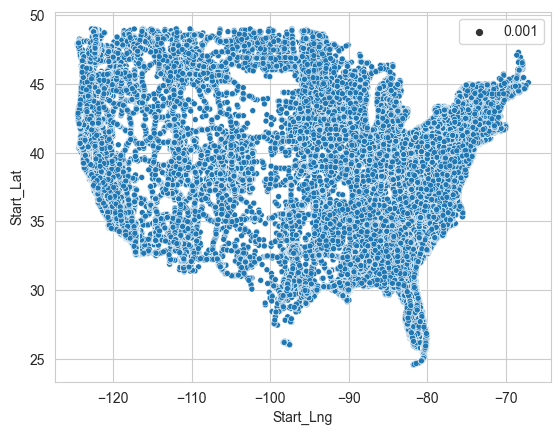

In [87]:
sns.scatterplot(x=ds.Start_Lng,y=ds.Start_Lat,data=ds,size=0.001)

# Heat map of US which shows the density of the accidents.

In [88]:
sample_ds=ds.sample(frac=0.25)

In [89]:
lat_lon_pairs = list(zip(list(sample_ds.Start_Lat), list(sample_ds.Start_Lng)))

In [90]:
import folium
from folium.plugins import HeatMap

In [91]:
map=folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map